# Vertebra crop preview

Preview the proposed refiner-training crops directly from the existing COCO four-corner annotations.

Edit only the **Configuration** cell to change the dataset path, split, image range/count, crop size, crop margin, or grid layout. The notebook shows:

1. Selected full radiographs with the annotation quadrilateral (yellow) and square crop ROI (green).
2. All resulting vertebra crops with TL, TR, BL, and BR landmarks mapped into crop coordinates.
3. Crop-containment and original -> crop -> original coordinate round-trip checks.

No cropped files are written to disk.

In [ ]:
# ==============================
# Configuration: edit this cell
# ==============================
from pathlib import Path

DATASET_ROOT = Path(r"C:\Users\gcpup\Desktop\Workspaces\AI\Spine-Opportunistic-Screening\dataset\processed\coco")
SPLIT = "train"  # train, val, or test

# Images are sorted by file_name before this range is applied.
# Example: start=20, stop=40, step=2 considers indices 20, 22, ..., 38.
IMAGE_START = 395
IMAGE_STOP = 415  # exclusive; use None to continue to the end
IMAGE_STEP = 1
NUM_IMAGES = 10  # maximum selected from the range; use None for the full range

# A square ROI is centered on the mean of the four corners.
# Its side length is max(annotation width, annotation height) * CROP_SCALE.
CROP_SCALE = 1.5
CROP_SIZE = 256

# Optional preview of detector-like crop errors. Keep False for the base crop check.
ENABLE_JITTER = True
CENTER_JITTER_FRACTION = 0.08  # fraction of ROI side in x and y
SCALE_JITTER_RANGE = (0.90, 1.10)
RANDOM_SEED = 20260710

OVERVIEW_COLUMNS = 3
CROP_COLUMNS = 8
MAX_TOTAL_CROPS = 96  # display limit only; use None to display every selected crop
DISPLAY_MAX_SIDE = 1200  # downsample full-image overviews to control notebook memory


In [14]:
import json
import math
import sys
from collections import defaultdict

import cv2
import matplotlib.pyplot as plt
import numpy as np

PROJECT_ROOT = DATASET_ROOT.parents[2]
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
from src.data.roi_geometry import crop_from_roi, make_square_roi, sample_contained_square_roi

CORNER_NAMES = ("TL", "TR", "BL", "BR")
CORNER_COLORS = ("red", "lime", "deepskyblue", "magenta")
POLYGON_ORDER = (0, 1, 3, 2, 0)

split_dir = DATASET_ROOT / SPLIT
annotation_path = split_dir / "_annotations.keypoints.coco.json"
if not annotation_path.exists():
    raise FileNotFoundError(f"Annotation file not found: {annotation_path}")

with annotation_path.open("r", encoding="utf-8") as file:
    coco = json.load(file)

annotations_by_image = defaultdict(list)
for annotation in coco["annotations"]:
    annotations_by_image[int(annotation["image_id"])].append(annotation)

indexed_images = list(enumerate(sorted(coco["images"], key=lambda item: item["file_name"].lower())))
indexed_images = [
    (dataset_index, image_info)
    for dataset_index, image_info in indexed_images
    if annotations_by_image.get(int(image_info["id"]))
]
selected_images = indexed_images[slice(IMAGE_START, IMAGE_STOP, IMAGE_STEP)]
if NUM_IMAGES is not None:
    selected_images = selected_images[: int(NUM_IMAGES)]
if not selected_images:
    raise ValueError("The configured image range selected no annotated images.")

print(f"Annotation file: {annotation_path}")
print(f"Annotated images in split: {len(indexed_images)}")
print(f"Selected images: {len(selected_images)}")
for dataset_index, image_info in selected_images:
    annotation_count = len(annotations_by_image[int(image_info["id"])])
    print(
        f"  [{dataset_index:04d}] {image_info['file_name']} | "
        f"source={image_info.get('source_dataset', 'unknown')} | annotations={annotation_count}"
    )


Annotation file: C:\Users\gcpup\Desktop\Workspaces\AI\Spine-Opportunistic-Screening\dataset\processed\coco\train\_annotations.keypoints.coco.json
Annotated images in split: 1403
Selected images: 10
  [0395] images/mendeley_pa/MENDE-PA-00112.jpg | source=Mendeley PA | annotations=16
  [0396] images/mendeley_pa/MENDE-PA-00113.jpg | source=Mendeley PA | annotations=14
  [0397] images/mendeley_pa/MENDE-PA-00116.jpg | source=Mendeley PA | annotations=16
  [0398] images/mendeley_pa/MENDE-PA-00117.jpg | source=Mendeley PA | annotations=15
  [0399] images/mendeley_pa/MENDE-PA-00118.jpg | source=Mendeley PA | annotations=13
  [0400] images/mendeley_pa/MENDE-PA-00119.jpg | source=Mendeley PA | annotations=14
  [0401] images/mendeley_pa/MENDE-PA-00120.jpg | source=Mendeley PA | annotations=14
  [0402] images/mendeley_pa/MENDE-PA-00122.jpg | source=Mendeley PA | annotations=10
  [0403] images/mendeley_pa/MENDE-PA-00123.jpg | source=Mendeley PA | annotations=14
  [0404] images/mendeley_pa/MENDE-PA-

## Crop and coordinate-transform logic

`cv2.warpAffine` performs an isotropic square crop and automatically pads any region outside the source image with black pixels. The same affine matrix maps the four landmarks into the crop; its inverse maps future refiner predictions back into the original radiograph.

In [15]:
def annotation_points(annotation):
    keypoints = np.asarray(annotation["keypoints"], dtype=np.float32).reshape(-1, 3)
    if keypoints.shape != (4, 3) or not np.all(keypoints[:, 2] > 0):
        return None
    return keypoints[:, :2]


def sort_annotations_top_to_bottom(annotations):
    valid = []
    for annotation in annotations:
        points = annotation_points(annotation)
        if points is not None:
            valid.append((float(points[:, 1].mean()), float(points[:, 0].mean()), annotation, points))
    valid.sort(key=lambda item: (item[0], item[1]))
    return [(annotation, points) for _, _, annotation, points in valid]


def make_preview_roi(points, rng):
    if rng is None:
        return make_square_roi(points, crop_scale=CROP_SCALE), 0, False
    return sample_contained_square_roi(
        points,
        crop_scale=CROP_SCALE,
        rng=rng,
        center_jitter_fraction=CENTER_JITTER_FRACTION,
        scale_jitter_range=SCALE_JITTER_RANGE,
        max_retries=10,
    )


def load_rgb(image_path):
    image_bgr = cv2.imread(str(image_path), cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise FileNotFoundError(image_path)
    return cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)


def resize_for_display(image_rgb, max_side):
    height, width = image_rgb.shape[:2]
    scale = min(1.0, float(max_side) / float(max(height, width)))
    if scale >= 1.0:
        return image_rgb
    return cv2.resize(
        image_rgb,
        (int(round(width * scale)), int(round(height * scale))),
        interpolation=cv2.INTER_AREA,
    )


def make_overview(image_rgb, image_crops):
    overlay = image_rgb.copy()
    height, width = overlay.shape[:2]
    thickness = max(2, int(round(max(height, width) / 900.0)))
    font_scale = max(0.5, max(height, width) / 2200.0)

    for record in image_crops:
        roi = np.rint(record["roi_xyxy"]).astype(int)
        points = np.rint(record["original_points"]).astype(np.int32)
        polygon = points[np.asarray(POLYGON_ORDER, dtype=int)]
        cv2.rectangle(overlay, tuple(roi[:2]), tuple(roi[2:]), (0, 255, 0), thickness)
        cv2.polylines(overlay, [polygon], False, (255, 215, 0), thickness)
        center = np.rint(record["original_points"].mean(axis=0)).astype(int)
        cv2.putText(
            overlay,
            str(record["vertebra_rank"]),
            tuple(center),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            thickness,
            cv2.LINE_AA,
        )
    return resize_for_display(overlay, DISPLAY_MAX_SIDE)


In [16]:
rng = np.random.default_rng(RANDOM_SEED) if ENABLE_JITTER else None
overview_records = []
crop_records = []
skipped_annotations = 0

for dataset_index, image_info in selected_images:
    image_path = split_dir / image_info["file_name"]
    image_rgb = load_rgb(image_path)
    image_height, image_width = image_rgb.shape[:2]
    valid_annotations = sort_annotations_top_to_bottom(
        annotations_by_image[int(image_info["id"])]
    )
    skipped_annotations += len(annotations_by_image[int(image_info["id"])]) - len(valid_annotations)

    image_crops = []
    for vertebra_rank, (annotation, points) in enumerate(valid_annotations, start=1):
        roi_xyxy, jitter_attempts, jitter_fallback = make_preview_roi(points, rng)
        transformed = crop_from_roi(image_rgb, points, roi_xyxy, CROP_SIZE)
        transformed["crop_rgb"] = transformed.pop("crop")
        record = {
            "dataset_index": dataset_index,
            "file_name": image_info["file_name"],
            "source_dataset": image_info.get("source_dataset", "unknown"),
            "image_id": int(image_info["id"]),
            "annotation_id": annotation.get("id"),
            "vertebra_rank": vertebra_rank,
            "jitter_attempts": jitter_attempts,
            "jitter_fallback": jitter_fallback,
            "roi_xyxy": roi_xyxy,
            "uses_padding": bool(
                roi_xyxy[0] < 0.0
                or roi_xyxy[1] < 0.0
                or roi_xyxy[2] > float(image_width)
                or roi_xyxy[3] > float(image_height)
            ),
            "original_points": points,
            **transformed,
        }
        image_crops.append(record)
        crop_records.append(record)

    overview_records.append(
        {
            "image_rgb": make_overview(image_rgb, image_crops),
            "title": (
                f"[{dataset_index:04d}] {Path(image_info['file_name']).name}\n"
                f"{image_info.get('source_dataset', 'unknown')} | {len(image_crops)} crops"
            ),
        }
    )

inside_count = sum(record["inside_crop"] for record in crop_records)
padding_count = sum(record["uses_padding"] for record in crop_records)
max_round_trip_error = max(record["round_trip_error"] for record in crop_records)
print(f"Generated crops: {len(crop_records)}")
print(f"Skipped incomplete annotations: {skipped_annotations}")
print(f"All four corners inside crop: {inside_count}/{len(crop_records)}")
print(f"ROIs requiring boundary padding: {padding_count}/{len(crop_records)}")
print(f"Maximum coordinate round-trip error: {max_round_trip_error:.6f} px")
if inside_count != len(crop_records):
    print("Note: outside-crop corners can be expected when optional jitter is enabled.")


Generated crops: 143
Skipped incomplete annotations: 0
All four corners inside crop: 143/143
ROIs requiring boundary padding: 0/143
Maximum coordinate round-trip error: 0.000345 px


## Full-image ROI overview

- **Yellow:** original four-corner quadrilateral.
- **Green:** square ROI sent to the refiner after resizing.
- **White number:** vertebra rank after sorting top-to-bottom.

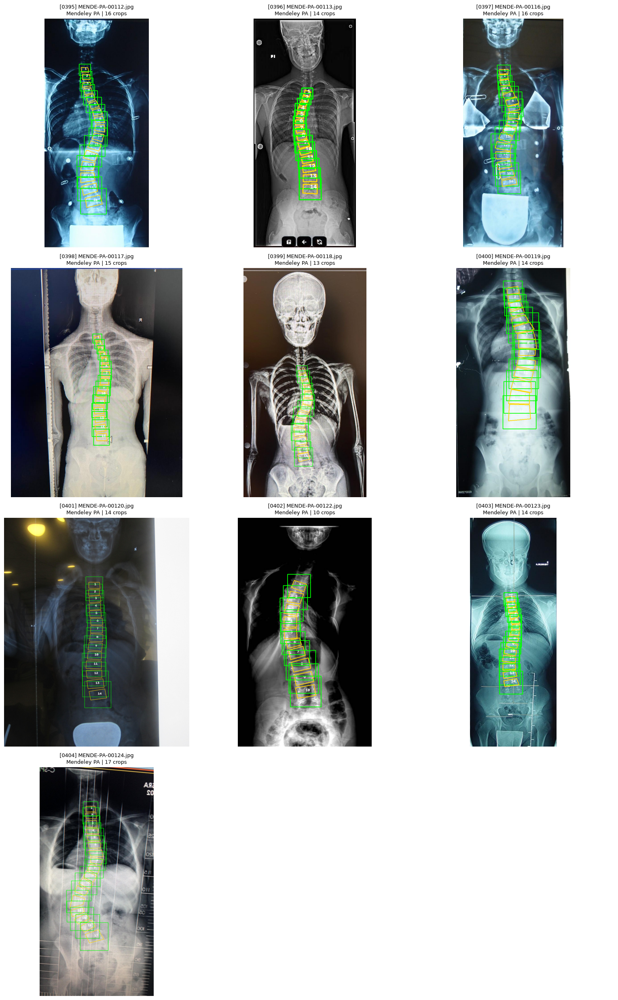

In [17]:
overview_columns = max(1, int(OVERVIEW_COLUMNS))
overview_rows = math.ceil(len(overview_records) / overview_columns)
fig, axes = plt.subplots(
    overview_rows,
    overview_columns,
    figsize=(5.2 * overview_columns, 6.2 * overview_rows),
    squeeze=False,
)
for axis, record in zip(axes.flat, overview_records):
    axis.imshow(record["image_rgb"])
    axis.set_title(record["title"], fontsize=9)
    axis.axis("off")
for axis in axes.flat[len(overview_records):]:
    axis.axis("off")
fig.tight_layout()
plt.show()


## Cropped vertebra contact sheet

Every crop is displayed at the configured `CROP_SIZE`. The colored points confirm that landmark order and coordinate mapping remain correct. A title ending in `OUTSIDE` means at least one point was moved outside the ROI, normally because optional jitter is enabled.

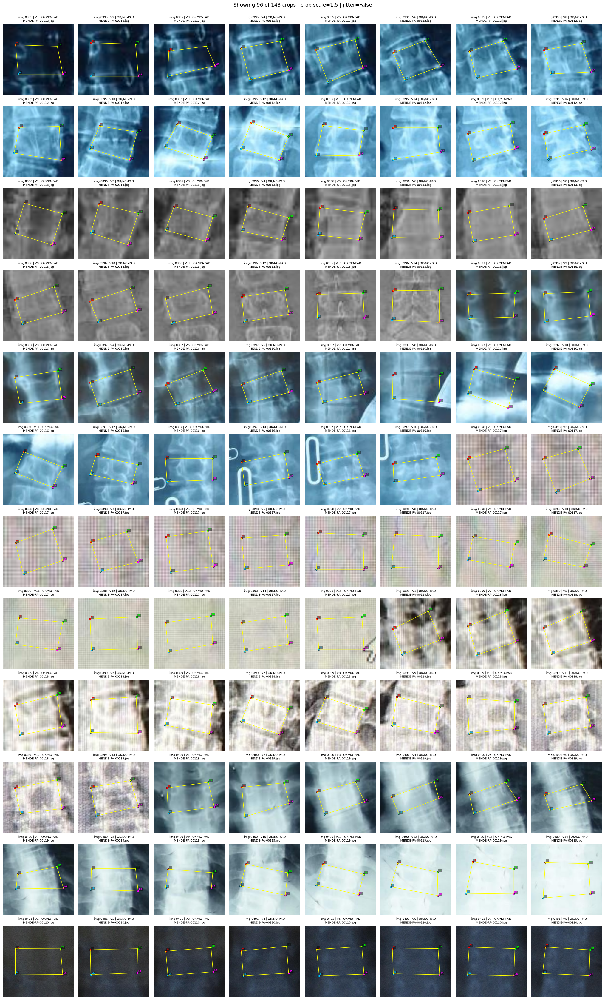

In [18]:
displayed_crops = crop_records
if MAX_TOTAL_CROPS is not None:
    displayed_crops = displayed_crops[: int(MAX_TOTAL_CROPS)]

crop_columns = max(1, int(CROP_COLUMNS))
crop_rows = math.ceil(len(displayed_crops) / crop_columns)
fig, axes = plt.subplots(
    crop_rows,
    crop_columns,
    figsize=(2.55 * crop_columns, 2.85 * crop_rows),
    squeeze=False,
)
for axis, record in zip(axes.flat, displayed_crops):
    axis.imshow(record["crop_rgb"])
    crop_points = record["crop_points"]
    polygon = crop_points[np.asarray(POLYGON_ORDER, dtype=int)]
    axis.plot(polygon[:, 0], polygon[:, 1], color="yellow", linewidth=1.0)
    for corner_name, color, point in zip(CORNER_NAMES, CORNER_COLORS, crop_points):
        axis.scatter(point[0], point[1], s=22, c=color, edgecolors="black", linewidths=0.4)
        axis.text(
            point[0] + 3,
            point[1] - 3,
            corner_name,
            color=color,
            fontsize=6,
            bbox={"facecolor": "black", "alpha": 0.45, "pad": 0.6, "linewidth": 0},
        )
    status = "OK" if record["inside_crop"] else "OUTSIDE"
    padding_status = "PAD" if record["uses_padding"] else "NO-PAD"
    axis.set_title(
        f"img {record['dataset_index']:04d} | V{record['vertebra_rank']} | {status}/{padding_status}\n"
        f"{Path(record['file_name']).name}",
        fontsize=7,
    )
    axis.set_xlim(0, CROP_SIZE)
    axis.set_ylim(CROP_SIZE, 0)
    axis.axis("off")
for axis in axes.flat[len(displayed_crops):]:
    axis.axis("off")
fig.suptitle(
    f"Showing {len(displayed_crops)} of {len(crop_records)} crops | "
    f"crop scale={CROP_SCALE} | jitter={ENABLE_JITTER}",
    fontsize=12,
)
fig.tight_layout(rect=(0, 0, 1, 0.98))
plt.show()


## What to inspect

A suitable crop should contain the whole annotated vertebra plus enough surrounding context, without making the vertebra unnecessarily small. Adjust `CROP_SCALE` in the configuration cell and rerun all cells. Once the base crops look correct, enable `ENABLE_JITTER` to preview the crop errors the refiner should tolerate during training.